In [1]:
from mayavi import mlab
import numpy as np

In [3]:
import numpy as np
from scipy.stats import multivariate_normal

# Resolution of the grid in each dimension
res = 10

# Generate a grid
x, y, z = np.mgrid[0:1:res*1j, 0:1:res*1j, 0:1:res*1j]

# Mean and covariance of the multivariate Gaussian
mu = np.array([0.5, 0.5, 0.5])
sigma = np.diag([0.1, 0.2, 0.3])**2

# Create a multivariate Gaussian distribution
rv = multivariate_normal(mu, sigma)

# Compute the density at each point in the grid
s = rv.pdf(np.column_stack([x.ravel(), y.ravel(), z.ravel()]))

# Reshape s back to the shape of the grid
s = s.reshape((res, res, res))


In [5]:
%gui qt

In [6]:
vol = mlab.pipeline.volume(mlab.pipeline.scalar_field(s))
# mlab.axes(xlabel='x', ylabel='y', zlabel='z', ranges=[0,1,0,1,0,1], nb_labels=5)
mlab.outline(vol)

In [ ]:
mlab.show()

In [10]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Volume(
    x=x.flatten(),
    y=y.flatten(),
    z=z.flatten(),
    value=s.flatten(),
    isomin=0,
    isomax=max(s.flatten()),
    opacity=0.1, # needs to be small to see through all surfaces
    surface_count=17, # needs to be a large number for good volume rendering
    ))
fig.show()

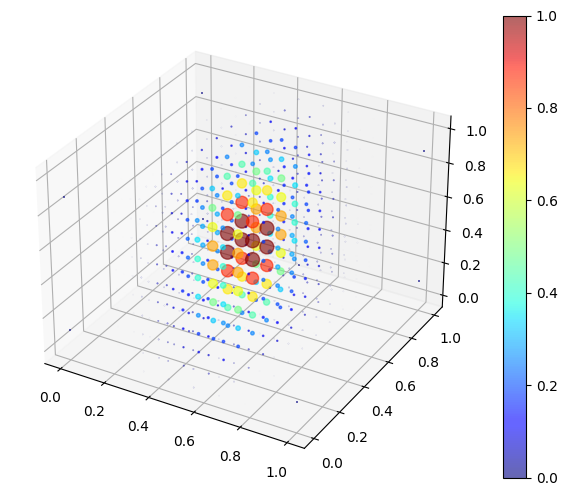

In [11]:
import numpy as np
from scipy.stats import multivariate_normal
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Resolution of the grid in each dimension
res = 10

# Generate a grid
x, y, z = np.mgrid[0:1:res*1j, 0:1:res*1j, 0:1:res*1j]

# Mean and covariance of the multivariate Gaussian
mu = np.array([0.5, 0.5, 0.5])
sigma = np.diag([0.1, 0.2, 0.3])**2

# Create a multivariate Gaussian distribution
rv = multivariate_normal(mu, sigma)

# Compute the density at each point in the grid
s = rv.pdf(np.column_stack([x.ravel(), y.ravel(), z.ravel()]))

# Reshape s back to the shape of the grid
s = s.reshape((res, res, res))

# Normalize s for color mapping
s_normalized = (s - s.min()) / (s.max() - s.min())

# Create a new figure and add a 3D subplot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot, with color and size of the points related to the value of s
sc = ax.scatter(x, y, z, s=100*s_normalized.flatten()**2, c=s_normalized.flatten(), cmap='jet', alpha=0.6)

# Add a color bar
plt.colorbar(sc)

# Show the plot
plt.show()


In [5]:
import numpy as np
from scipy.stats import multivariate_normal
import plotly.graph_objects as go

# Resolution of the grid in each dimension
res = 10

# Generate a grid
x, y, z = np.mgrid[0:1:res*1j, 0:1:res*1j, 0:1:res*1j]

# Mean and covariance of the multivariate Gaussian
mu = np.array([0.5, 0.5, 0.5])
sigma = np.diag([0.1, 0.2, 0.3])**2

# Create a multivariate Gaussian distribution
rv = multivariate_normal(mu, sigma)

# Compute the density at each point in the grid
s = rv.pdf(np.column_stack([x.ravel(), y.ravel(), z.ravel()]))

# Reshape s back to the shape of the grid
s = s.reshape((res, res, res))

# Normalize s for color mapping
s_normalized = (s - s.min()) / (s.max() - s.min())

# Create a scatter3d plot
scatter = go.Scatter3d(
    x=x.ravel(),
    y=y.ravel(),
    z=z.ravel(),
    mode='markers',
    marker=dict(
        size=20 * s_normalized.ravel(),
        color=s_normalized.ravel(),
        colorscale='jet',   # choose a colorscale
#         opacity=list(s_normalized.ravel())
        line=dict(width=0)
    )
)

fig = go.Figure(data=[scatter])
fig.show()


In [19]:
import plotly.graph_objs as go

opacity_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]  # change these values to your needs

trace = go.Scatter3d(
    x=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10],  # example x values
    y=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10],  # example y values
    z=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10],  # example z values
    mode='markers',
    marker=dict(
        size=20,
        color='rgb(51,204,153)',  # set color to an array/list of desired values
        opacity=opacity_values,  # set opacity to an array/list of values
    )
)

data = [trace]

layout = go.Layout(
    title='Setting Different Opacity for Each Marker in Plotly',
    xaxis=dict(
        title='X Axis',
    ),
    yaxis=dict(
        title='Y Axis',
    ),
)

fig = go.Figure(data=data, layout=layout)
fig.show()


ValueError: 
    Invalid value of type 'builtins.list' received for the 'opacity' property of scatter3d.marker
        Received value: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

    The 'opacity' property is a number and may be specified as:
      - An int or float in the interval [0, 1]

In [20]:
import plotly.graph_objs as go

x_values = [1, 2, 3, 4, 5]
y_values = [1, 2, 3, 4, 5]
z_values = [1, 2, 3, 4, 5]
opacity_values = [0.1, 0.2, 0.3, 0.4, 0.5]  # example opacity values

data = []

for x, y, z, opacity in zip(x_values, y_values, z_values, opacity_values):
    trace = go.Scatter3d(
        x=[x],
        y=[y],
        z=[z],
        mode='markers',
        marker=dict(
            size=10,
            color='rgb(51,204,153)',
            opacity=opacity,
        )
    )
    data.append(trace)

layout = go.Layout(
    title='Setting Different Opacity for Each Marker in a 3D Scatter Plot in Plotly',
)

fig = go.Figure(data=data, layout=layout)
fig.show()

In [13]:
import numpy as np
from scipy.stats import multivariate_normal
import plotly.graph_objs as go

# Your script for generating data
res = 20
x, y, z = np.mgrid[0:1:res*1j, 0:1:res*1j, 0:1:res*1j]
mu = np.array([0.5, 0.5, 0.5])
sigma = np.diag([0.05, 0.1, 0.2])**2
rv = multivariate_normal(mu, sigma)
s = rv.pdf(np.column_stack([x.ravel(), y.ravel(), z.ravel()]))
s = s.reshape((res, res, res))

# superresolution for visualization
res *= 2
x, y, z = np.mgrid[0:1:res*1j, 0:1:res*1j, 0:1:res*1j]
s = s.repeat(2, axis=0).repeat(2, axis=1).repeat(2, axis=2)


s_normalized = (s - s.min()) / (s.max() - s.min())


# randomly perturbate points for antialiasing
x += (np.random.rand(*x.shape)-0.5)/res
y += (np.random.rand(*y.shape)-0.5)/res
z += (np.random.rand(*z.shape)-0.5)/res

# Flatten the data for easy processing
x = x.ravel()
y = y.ravel()
z = z.ravel()
s_normalized = s_normalized.ravel()

# filter the values greater than eps
eps = 0.01
mask = s_normalized > eps
# x = x[mask]
# y = y[mask]
# z = z[mask]
# s_normalized = s_normalized[mask]

# Define bin edges for grouping
n_group = 20
bin_edges = np.linspace(0, 1, n_group+1)

# Compute the bin index for each point (this will be an array of the same size as s_normalized)
groups = np.digitize(s_normalized, bin_edges, right=True) - 1

# Compute opacity values for each group
opacity_values = np.linspace(0.001, 0.4, n_group)

data = []

# Create a trace for each group
for i in range(n_group):
    # Select points that belong to the current group
    mask = groups == i
    trace = go.Scatter3d(
        x=x[mask],
        y=y[mask],
        z=z[mask],
        mode='markers',
        marker=dict(
            size=5,
            color='rgb(51,204,153)',
#             color=s_normalized.ravel(),
#             colorscale='Jet',
            opacity=opacity_values[i],
        ),
        name=f'Group {i+1}'
    )
    data.append(trace)

    
# Specify the range for each axis
scene = dict(
    xaxis=dict(range=[0, 1], tickvals=np.linspace(0, 1, 6)),
    yaxis=dict(range=[0, 1], tickvals=np.linspace(0, 1, 6)),
    zaxis=dict(range=[0, 1], tickvals=np.linspace(0, 1, 6)),
    aspectmode='cube'
)

layout = go.Layout(
    title='3D Gaussian Distribution with Varying Opacity',
    scene=scene
)

fig = go.Figure(data=data, layout=layout)
fig.show()
